##SOFTSENSOR PARA EL PROCESO DE FABRICACIÓN DE PULPA Y PAPEL. 💻📰🏭

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 250
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Cargando los datos.
data = pd.read_csv("data.csv", usecols=range(1,23))
# calculando los datos faltantes por columna.
nan_x_col =pd.DataFrame({
    "Column":data.columns,"NaN":data.isna().sum(axis=0).values})

'Aqui se observa que las variables con mas faltantes son AAWhiteSt-4  y SulphidityL-4'

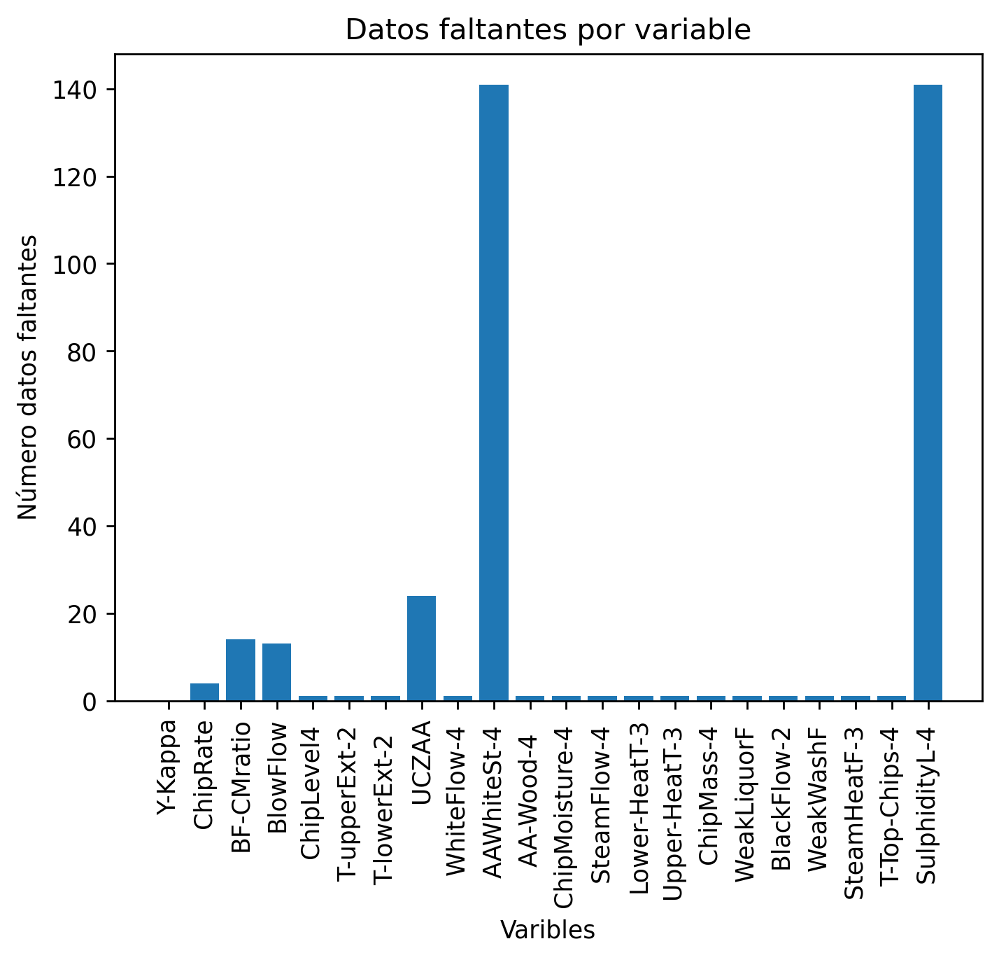

In [3]:
# Visualizacion de los datos
plt.bar(nan_x_col["Column"],nan_x_col["NaN"])
plt.xlabel("Variables")
plt.ylabel("Número datos faltantes")
plt.title("Datos faltantes por variable")
plt.xticks(rotation=90)

"Aqui se observa que las variables con mas faltantes son AAWhiteSt-4  y SulphidityL-4"

In [4]:
#Eliminando columnas con mas faltantes.
print(data.columns)  # tener en cuenta que los nombre hagan match exacto como en dataframe.
Data_cleaned = data.drop(columns= ["AAWhiteSt-4 ",'SulphidityL-4 '])

Index(['Y-Kappa', 'ChipRate', 'BF-CMratio', 'BlowFlow', 'ChipLevel4 ',
       'T-upperExt-2 ', 'T-lowerExt-2  ', 'UCZAA', 'WhiteFlow-4 ',
       'AAWhiteSt-4 ', 'AA-Wood-4  ', 'ChipMoisture-4 ', 'SteamFlow-4 ',
       'Lower-HeatT-3', 'Upper-HeatT-3 ', 'ChipMass-4 ', 'WeakLiquorF ',
       'BlackFlow-2 ', 'WeakWashF ', 'SteamHeatF-3 ', 'T-Top-Chips-4 ',
       'SulphidityL-4 '],
      dtype='object')


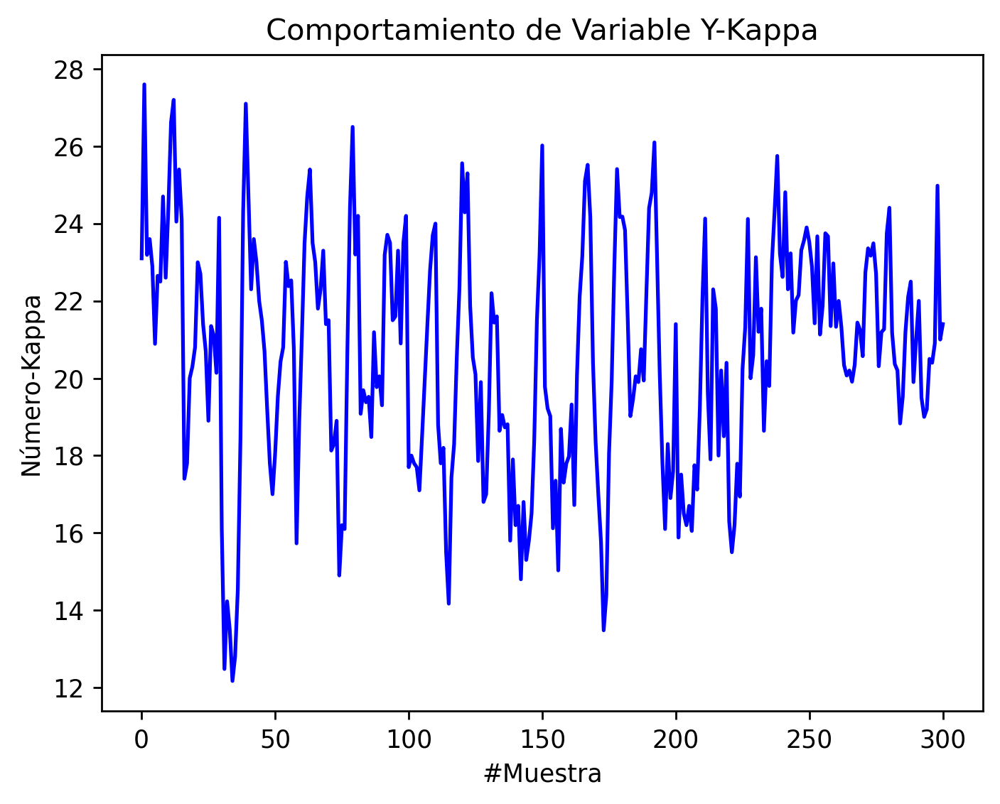

In [5]:
#Visualizacion de datos limpios
plt.plot(data["Y-Kappa"],"b")
plt.xlabel("#Muestra")
plt.ylabel("Número-Kappa")
plt.title("Comportamiento de Variable Y-Kappa")
plt.show

sns.pairplot(Data_cleaned)

In [6]:
# ahora terminamos de eliminar cualquier fila que tenga NaN (datos faltantes).
Data_cleaned = Data_cleaned.dropna(axis=0)

# Separamos inputs de outpus
X = Data_cleaned.drop(columns=["Y-Kappa"])
y = Data_cleaned["Y-Kappa"]

#Creamos los conjuntos de datos entrenamiento y evaluacion

In [12]:
# Train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 42)



In [14]:
# Escalado de variables
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler

X_scaler = StandardScaler()
y_scaler = StandardScaler()

# Escalando Inputs
X_train_esc = X_scaler.fit_transform(X_train)
X_test_esc = X_scaler.fit_transform(X_test)
# Escalando outputs
y_train_esc = y_scaler.fit_transform(pd.DataFrame(y_train))
y_test_esc = y_scaler.fit_transform(pd.DataFrame(y_test))

In [15]:
#Modelado
componentes = 9

Pls = PLSRegression(n_components=componentes)
Pls.fit(X_train_esc,y_train_esc)
y_predic = Pls.predict(X_test_esc)

print("Error: ", mean_squared_error(y_test_esc,y_predic))

Error:  0.2716358154487919


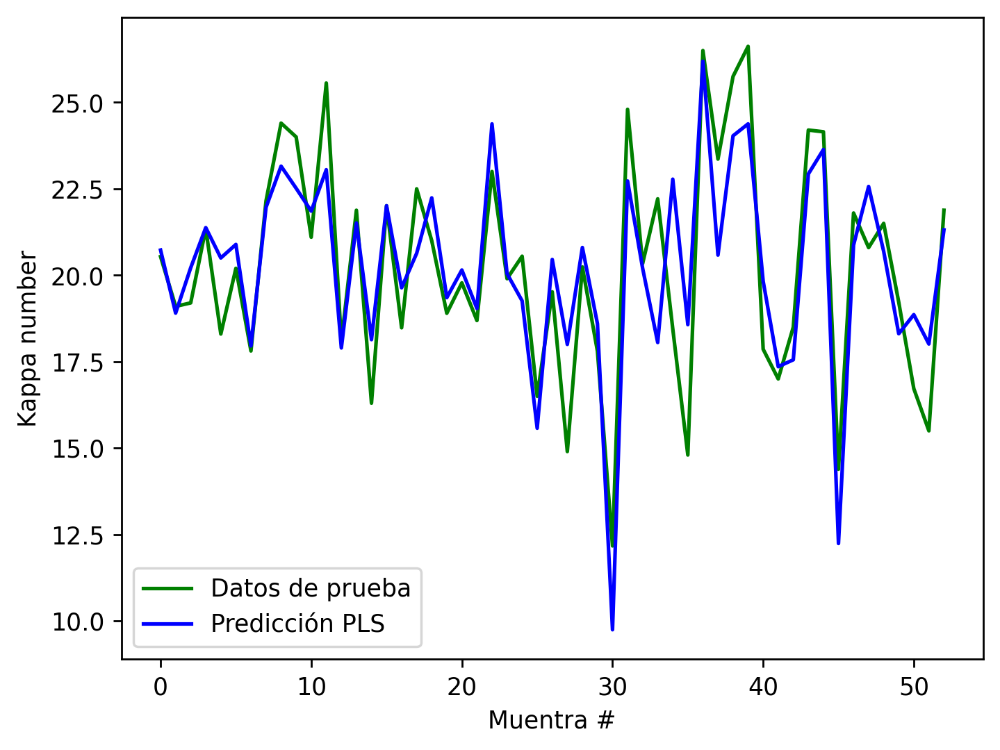

In [28]:
#Graficas
#y_train_predict = y_scaler.inverse_transform(y_predic)
y_predict_n = y_scaler.inverse_transform(y_predic)


plt.figure()
plt.plot(np.array(y_test), 'g',  label = 'Datos de prueba')
plt.plot(y_predict_n, 'b',  label = 'Predicción PLS')
plt.ylabel('Kappa number')
plt.xlabel('Muentra #')
plt.legend()


